In [2]:
import pandas as pd

df = pd.read_csv('/Users/qbs/downloads/games.csv')

print(df.head())


     AppID                   Name  Release date Estimated owners  Peak CCU  \
0    20200       Galactic Bowling  Oct 21, 2008        0 - 20000         0   
1   655370           Train Bandit  Oct 12, 2017        0 - 20000         0   
2  1732930           Jolt Project  Nov 17, 2021        0 - 20000         0   
3  1355720               Henosis™  Jul 23, 2020        0 - 20000         0   
4  1139950  Two Weeks in Painland   Feb 3, 2020        0 - 20000         0   

   Required age  Price  DLC count  \
0             0  19.99          0   
1             0   0.99          0   
2             0   4.99          0   
3             0   5.99          0   
4             0   0.00          0   

                                      About the game  \
0  Galactic Bowling is an exaggerated and stylize...   
1  THE LAW!! Looks to be a showdown atop a train....   
2  Jolt Project: The army now has a new robotics ...   
3  HENOSIS™ is a mysterious 2D Platform Puzzler w...   
4  ABOUT THE GAME Play as a 

In [28]:
print(df.describe())


              AppID       Peak CCU  Required age         Price     DLC count  \
count  7.171500e+04   71715.000000  71715.000000  71715.000000  71715.000000   
mean   1.199233e+06     140.763160      0.343499      7.223156      0.615394   
std    5.982204e+05    5797.045907      2.362144     11.072095     14.932957   
min    1.000000e+01       0.000000      0.000000      0.000000      0.000000   
25%    7.005500e+05       0.000000      0.000000      0.990000      0.000000   
50%    1.176780e+06       0.000000      0.000000      4.990000      0.000000   
75%    1.692260e+06       1.000000      0.000000      9.990000      0.000000   
max    2.379920e+06  872138.000000     21.000000    999.000000   2366.000000   

           Positive       Negative  Achievements  Recommendations  \
count  7.171500e+04   71715.000000  71715.000000     7.171500e+04   
mean   1.114768e+03     182.118065     21.642278     8.981311e+02   
std    2.652264e+04    4975.240406    185.584866     1.947641e+04   
min

In [3]:
def clean_price(price):
    try:
        return float(price)
    except:
        return None  # or you can use a placeholder like 0 or -1

df['Price'] = df['Price'].apply(clean_price)


In [4]:
bins = [-1, 0, 10, 1000]  # This means: (-1 to 0], (0 to 10], (10 to 1000]
labels = ['Free', 'Low-cost', 'Expensive']
df['Price_Category'] = pd.cut(df['Price'], bins=bins, labels=labels)


In [5]:
# Only quantitative columns
df_quantitative = df.select_dtypes(include=['float64', 'int64'])

# Only qualitative columns
df_qualitative = df.select_dtypes(exclude=['float64', 'int64'])
print(df.head())

     AppID                   Name  Release date Estimated owners  Peak CCU  \
0    20200       Galactic Bowling  Oct 21, 2008        0 - 20000         0   
1   655370           Train Bandit  Oct 12, 2017        0 - 20000         0   
2  1732930           Jolt Project  Nov 17, 2021        0 - 20000         0   
3  1355720               Henosis™  Jul 23, 2020        0 - 20000         0   
4  1139950  Two Weeks in Painland   Feb 3, 2020        0 - 20000         0   

   Required age  Price  DLC count  \
0             0  19.99          0   
1             0   0.99          0   
2             0   4.99          0   
3             0   5.99          0   
4             0   0.00          0   

                                      About the game  \
0  Galactic Bowling is an exaggerated and stylize...   
1  THE LAW!! Looks to be a showdown atop a train....   
2  Jolt Project: The army now has a new robotics ...   
3  HENOSIS™ is a mysterious 2D Platform Puzzler w...   
4  ABOUT THE GAME Play as a 

In [6]:
from sklearn.feature_extraction.text import CountVectorizer
# Remove rows with NaN 'Name' values
df = df[df['Name'].notna()]



vectorizer = CountVectorizer()
X = vectorizer.fit_transform(df['Name'])
df_vectorized = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())

print(df_vectorized.head())




   00  000  001  00111  002  005  006  007  01  011  ...  피랍  학생들의  한국  현명한  \
0   0    0    0      0    0    0    0    0   0    0  ...   0     0   0    0   
1   0    0    0      0    0    0    0    0   0    0  ...   0     0   0    0   
2   0    0    0      0    0    0    0    0   0    0  ...   0     0   0    0   
3   0    0    0      0    0    0    0    0   0    0  ...   0     0   0    0   
4   0    0    0      0    0    0    0    0   0    0  ...   0     0   0    0   

   화이트래빗  회사  흡혈귀의  ３豪華限定版  ３０才の夢追い人  ４人打ちアクション麻雀  
0      0   0     0       0         0            0  
1      0   0     0       0         0            0  
2      0   0     0       0         0            0  
3      0   0     0       0         0            0  
4      0   0     0       0         0            0  

[5 rows x 38495 columns]


In [7]:
#Drop non-useable columns
columns_to_drop = ['Reviews', 'Support url', 'Support email', 'Metacritic score', 
                   'Metacritic url', 'User score', 'Score rank', 'Notes', 'Screenshots', 'Movies']

# Drop the columns
df = df.drop(columns=columns_to_drop, errors='ignore')


In [8]:
#Handle Missing Values
df['About the game'] = df['About the game'].fillna('No Description')
df['Supported languages'] = df['Supported languages'].fillna('No Supported Languages')
df['Full audio languages'] = df['Full audio languages'].fillna('No Audio Languages')
df['Website'] = df['Website'].fillna('No Websites')
df['Developers'] = df['Developers'].fillna('No Developers')
df['Publishers'] = df['Publishers'].fillna('No Publishers')
df['Categories'] = df['Categories'].fillna('No Categories')
df['Genres'] = df['Genres'].fillna('No Genres')
df['Tags'] = df['Tags'].fillna('No Tags')
df = df.dropna()

In [9]:
print(df.head())

     AppID                   Name  Release date Estimated owners  Peak CCU  \
0    20200       Galactic Bowling  Oct 21, 2008        0 - 20000         0   
1   655370           Train Bandit  Oct 12, 2017        0 - 20000         0   
2  1732930           Jolt Project  Nov 17, 2021        0 - 20000         0   
3  1355720               Henosis™  Jul 23, 2020        0 - 20000         0   
4  1139950  Two Weeks in Painland   Feb 3, 2020        0 - 20000         0   

   Required age  Price  DLC count  \
0             0  19.99          0   
1             0   0.99          0   
2             0   4.99          0   
3             0   5.99          0   
4             0   0.00          0   

                                      About the game  \
0  Galactic Bowling is an exaggerated and stylize...   
1  THE LAW!! Looks to be a showdown atop a train....   
2  Jolt Project: The army now has a new robotics ...   
3  HENOSIS™ is a mysterious 2D Platform Puzzler w...   
4  ABOUT THE GAME Play as a 

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15,7))
sns.countplot(data=df, y='Genres', order=df['Genres'].value_counts().index)
plt.title('Distribution of Game Genres')
plt.xlabel('Number of Games')
plt.show()


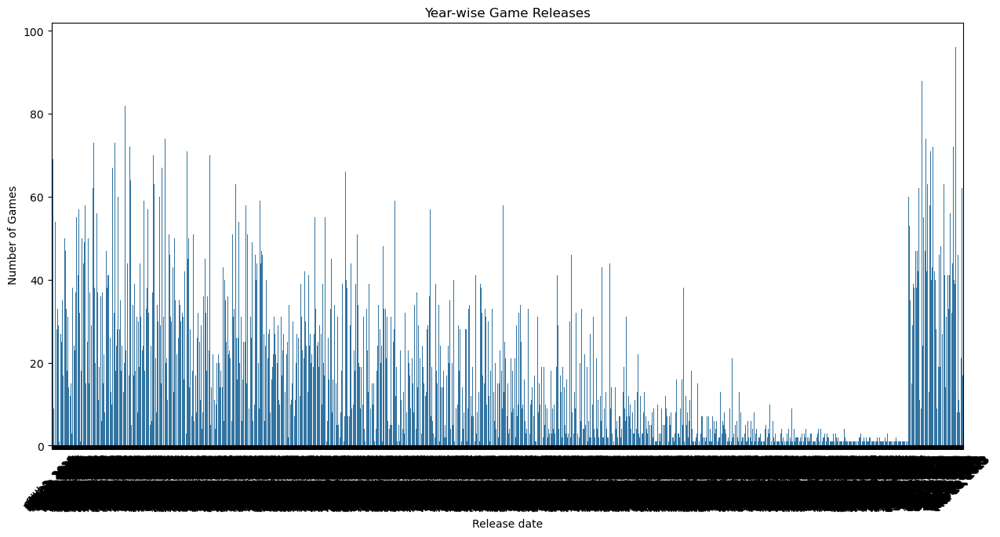

In [14]:
plt.figure(figsize=(15,7))
sns.countplot(data=df, x='Release date')
plt.title('Year-wise Game Releases')
plt.ylabel('Number of Games')
plt.xticks(rotation=45)
plt.show()


/var/folders/00/v47jm2yj45586bq73lrp36nh0000gn/T/ipykernel_55520/2896369396.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_rated, y='Name', x='User_Score', palette='viridis')
/Users/qbs/anaconda3/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 36015 (\N{CJK UNIFIED IDEOGRAPH-8CAF}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/qbs/anaconda3/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 27700 (\N{CJK UNIFIED IDEOGRAPH-6C34}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/qbs/anaconda3/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 27133 (\N{CJK UNIFIED IDEOGRAPH-69FD}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


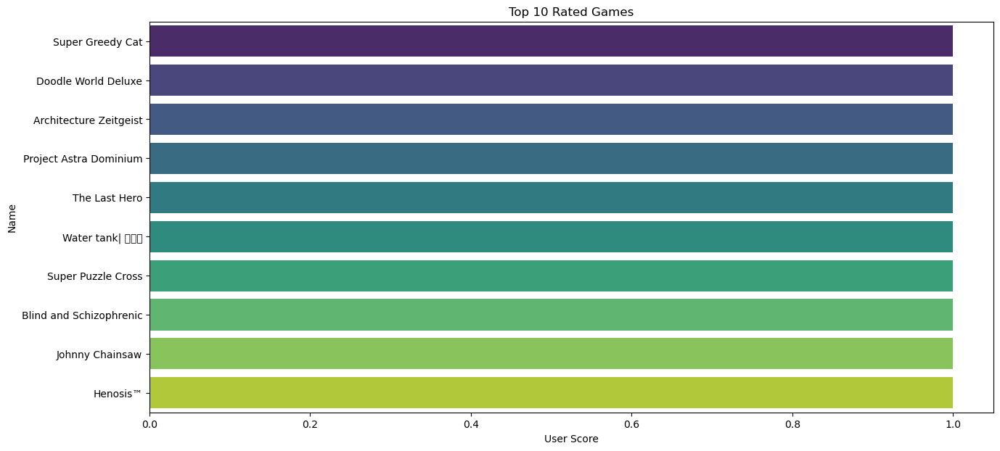

In [15]:
df['User_Score'] = df['Positive']/(df['Positive'] + df['Negative'])
top_rated = df.sort_values(by='User_Score', ascending=False).head(10)  # Assuming you have a column named 'User_Score'
plt.figure(figsize=(15,7))
sns.barplot(data=top_rated, y='Name', x='User_Score', palette='viridis')
plt.title('Top 10 Rated Games')
plt.xlabel('User Score')
plt.show()


/var/folders/00/v47jm2yj45586bq73lrp36nh0000gn/T/ipykernel_55520/2899654527.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, cmap='coolwarm')


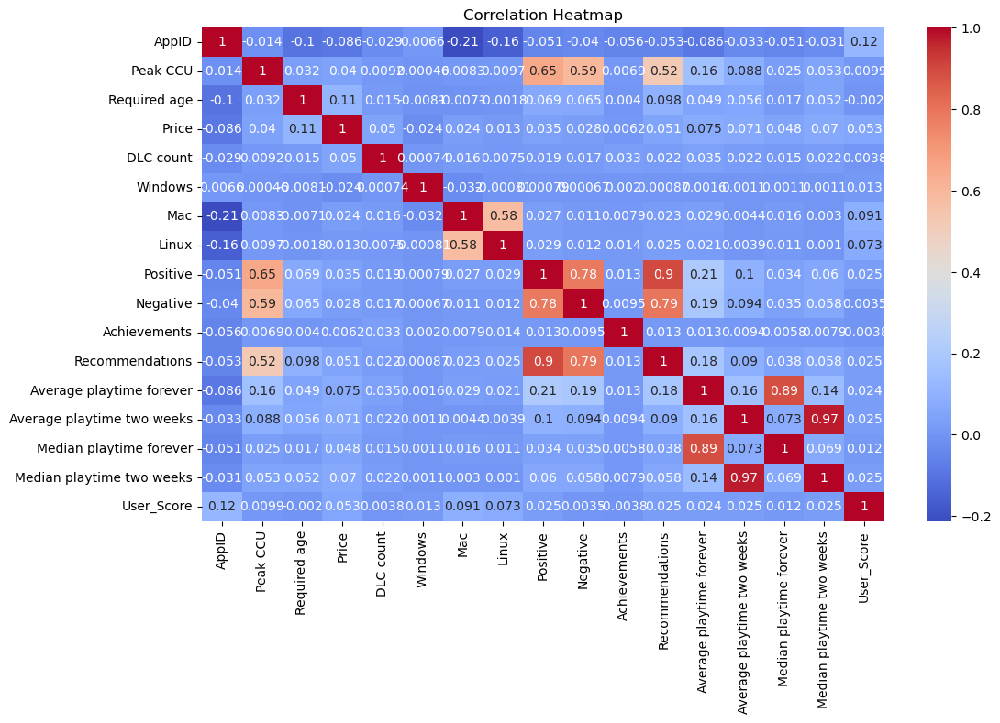

In [16]:
plt.figure(figsize=(12,7))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


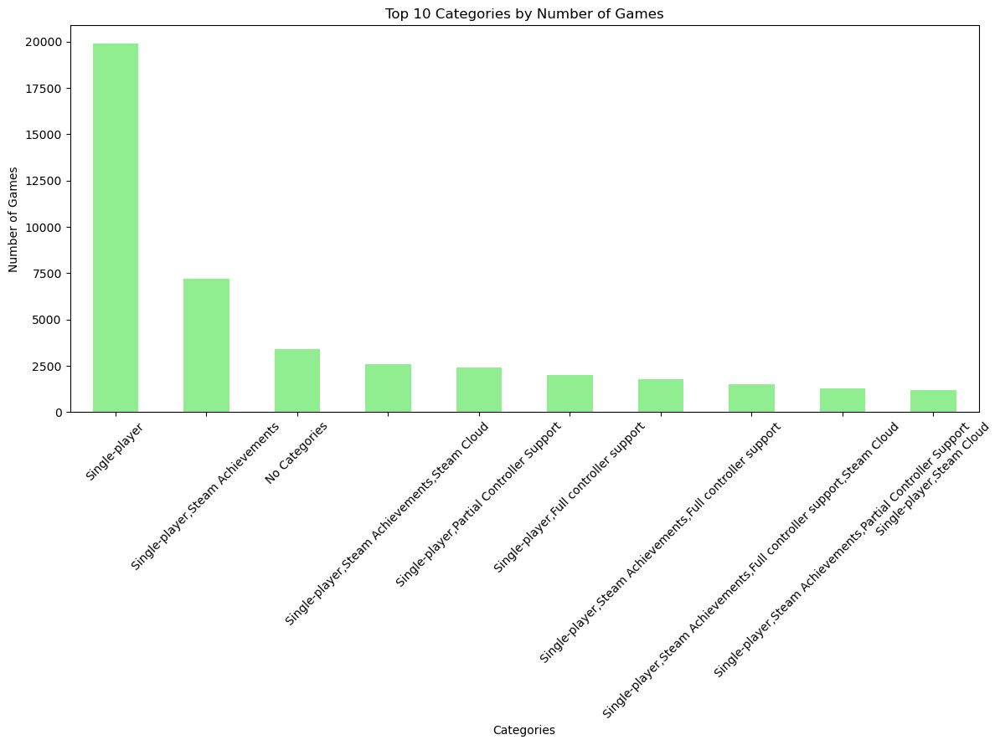

In [19]:
plt.figure(figsize=(14, 6))
df['Categories'].value_counts().head(10).plot(kind='bar', color='lightgreen')
plt.title('Top 10 Categories by Number of Games')
plt.xlabel('Categories')
plt.ylabel('Number of Games')
plt.xticks(rotation=45)
plt.show()


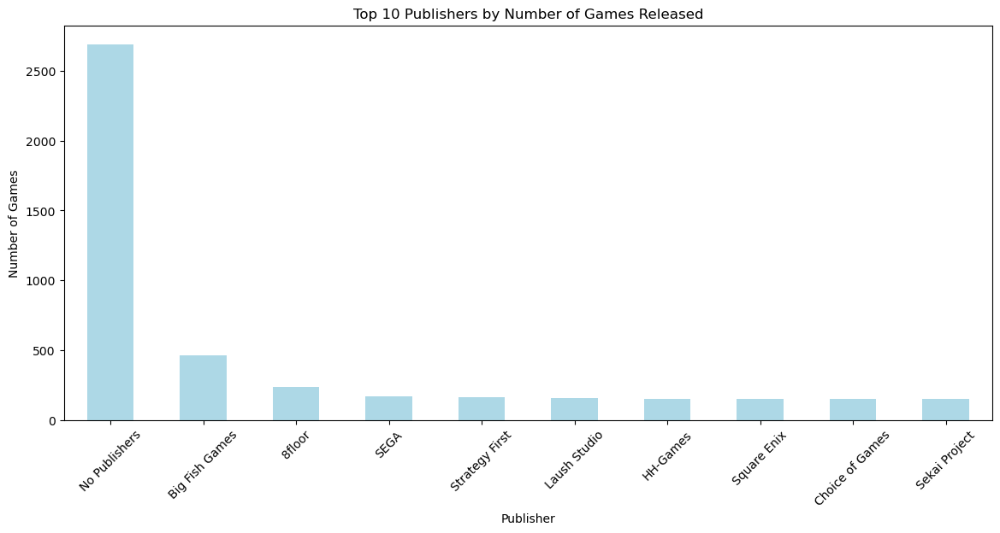

In [21]:
plt.figure(figsize=(14, 6))
df['Publishers'].value_counts().head(10).plot(kind='bar', color='lightblue')
plt.title('Top 10 Publishers by Number of Games Released')
plt.xlabel('Publisher')
plt.ylabel('Number of Games')
plt.xticks(rotation=45)
plt.show()


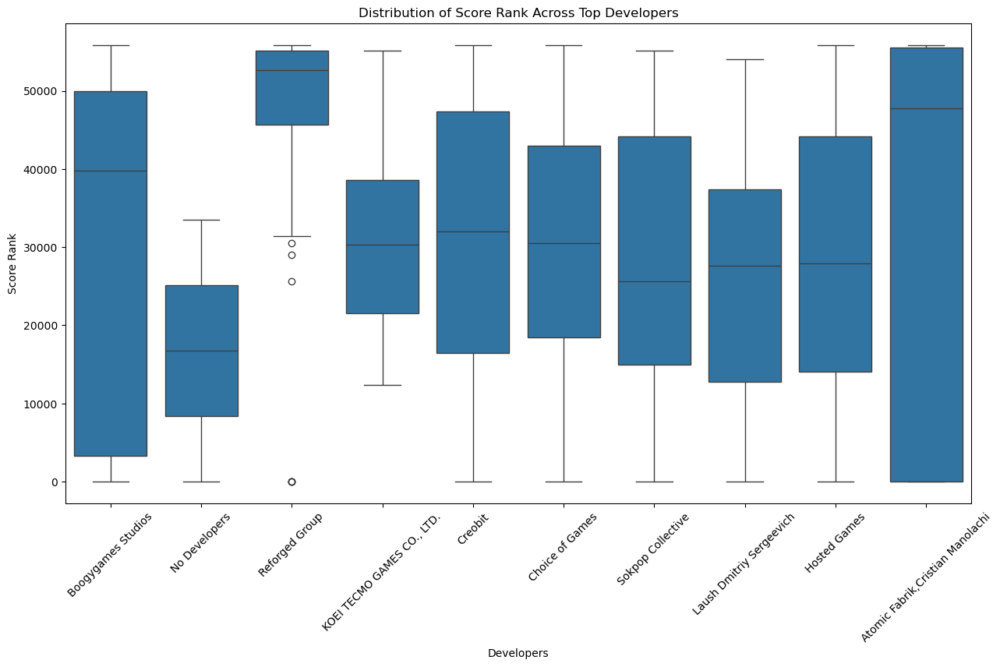

In [23]:
df['score_rank'] = df['User_Score'].rank(ascending=False, method='min')
import matplotlib.pyplot as plt
import seaborn as sns

top_developers = df['Developers'].value_counts().index[:10]

filtered_df = df[df['Developers'].isin(top_developers)]

plt.figure(figsize=(15, 8))
sns.boxplot(x='Developers', y='score_rank', data=filtered_df)
plt.title('Distribution of Score Rank Across Top Developers')
plt.ylabel('Score Rank')
plt.xlabel('Developers')
plt.xticks(rotation=45)
plt.show()


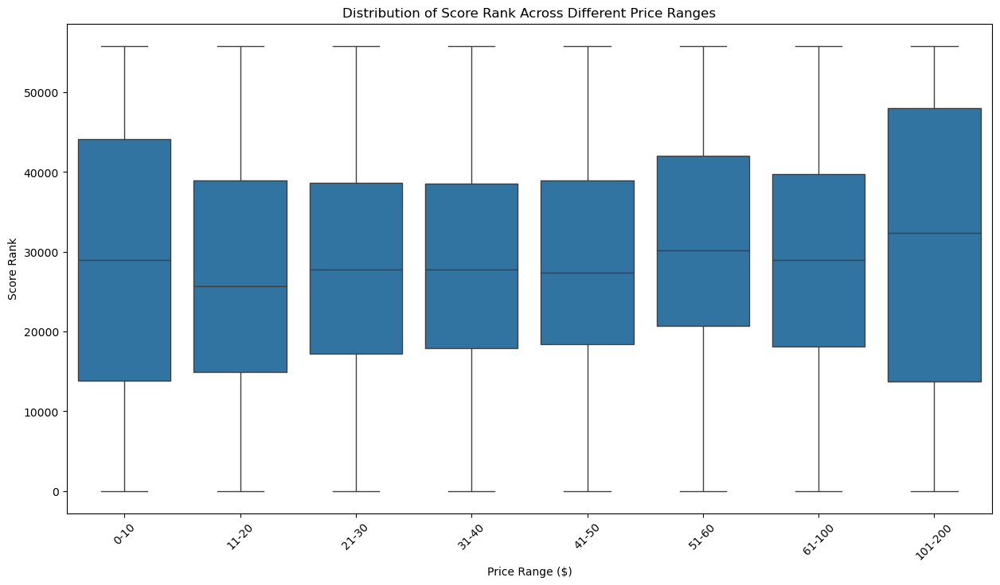

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns

bins = [0, 10, 20, 30, 40, 50, 60, 100, 200]
labels = ['0-10', '11-20', '21-30', '31-40', '41-50', '51-60', '61-100', '101-200']
df['price_bin'] = pd.cut(df['Price'], bins=bins, labels=labels, right=False)

plt.figure(figsize=(15, 8))
sns.boxplot(x='price_bin', y='score_rank', data=df)
plt.title('Distribution of Score Rank Across Different Price Ranges')
plt.ylabel('Score Rank')
plt.xlabel('Price Range ($)')
plt.xticks(rotation=45)
plt.show()


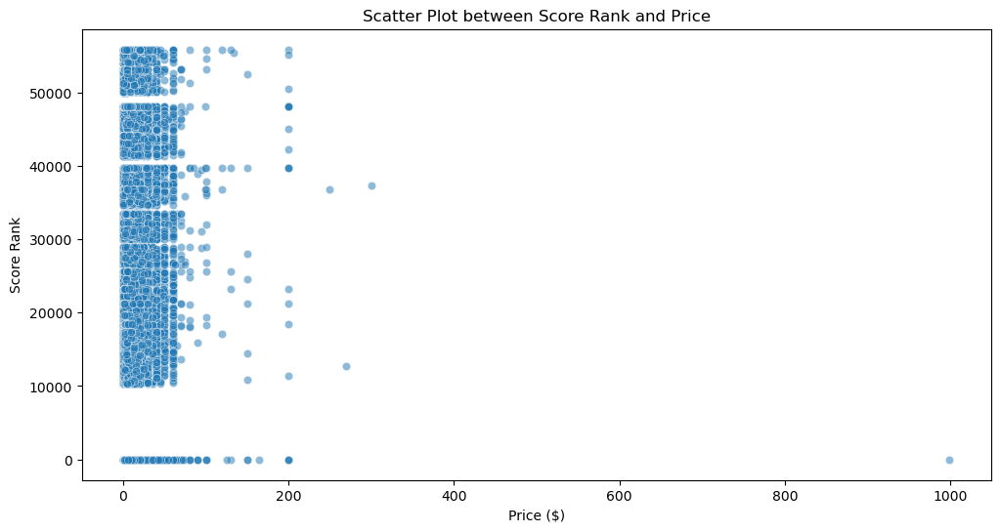

In [27]:

plt.figure(figsize=(12, 6))
sns.scatterplot(x='Price', y='score_rank', data=df, alpha=0.5)
plt.title('Scatter Plot between Score Rank and Price')
plt.ylabel('Score Rank')
plt.xlabel('Price ($)')
plt.show()
